# Рынок заведений общественного питания Москвы

Цель проекта: 

На основе предоставленных данных изучить рынок общепита в Москве в общем и кофенйн в частности. 

Для этого, изучим доступные данные на их пригодность к исследованию рынка общепита. Посмотрим какя информация есть у нас, есть ли пропуски, дубликаты, все ли типы данных корректны для работы. Приведем данные в порядок для дальнейшего изучения. Добавим столбцы с круглосуточными заведениями и не круглосуточными и с улицей заведения. 

Проанализируем данные по категориям. Какие категории самые популярные. Проанализируем количество мест в заведениях. Выясним какое среднее количество характерно для каждого типа заведения. 

Затем рассмотрим разницу между сетевыми и не сетивыми заведениями по категориям. Посмотрим на топ 15 сетевых заведений по количеству. Выявим, к каким категориям они относятся. Также выясним в какой категории сететые заведения наиболее распространены среди топа. 

Рассмотрим распределение заведение по округам.Затем посмотрим на средние рейтинги в зависимости от региона. Построим карту в зависимости от среднего рейтинга. 

Выделим топ 15 улиц по количеству заведений. Построим графики по колличеству заведений по этим улица по категориям. Затем рассмотрим улицы, где назодится по 1 заведению. Выясним, почему так получилось. 

Затем проанализируем разницу цен по огругам. Выявим самые дорогие и самые дешевые округа. 

Приступим к анализу кофейн. Посмотрим на их распределение по регионам. Выявим то 15 улиц. Посмотрим есть ли осбенности расположения кофейн. Затем проанализируем разницу цены между регионами. проанализируем рейтинги по регионам. Выясним, на какую стоимость чашки кофе стоит расчитывать при открытии кофейни. 

В данных у нас есть название заведения, категория, адрес, округ, часы работы, широта/долгота, рейтинг,категория цены, счет, средний чек, стоимость чашки капучино, сетевое заведение или нет, количество мест.

# Изучение общей информации<a id="l"></a> 

Для этого, изучим доступные данные на их пригодность к исследованию рынка общепита. Посмотрим какя информация есть у нас, есть ли пропуски, дубликаты, все ли типы данных корректны для работы. 

In [194]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from folium import Map, Marker
from folium.features import CustomIcon
from folium import Choropleth
from matplotlib import pyplot, transforms
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
import scipy.stats as stats
import math as mth
from scipy import stats as st
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import json


In [195]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [196]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В данных у нас есть название заведения, категория, адрес, округ, часы работы, широта/долгота, рейтинг,категория цены, счет, средний чек, стоимость чашки капучино, сетевое заведение или нет, количество мест. 

In [197]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


# Переработка данных<a id="k"></a> 

Приступим к переработке данных, чтобы анализ данных не искажался дубликатами и не полными данными. 

In [198]:
data.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

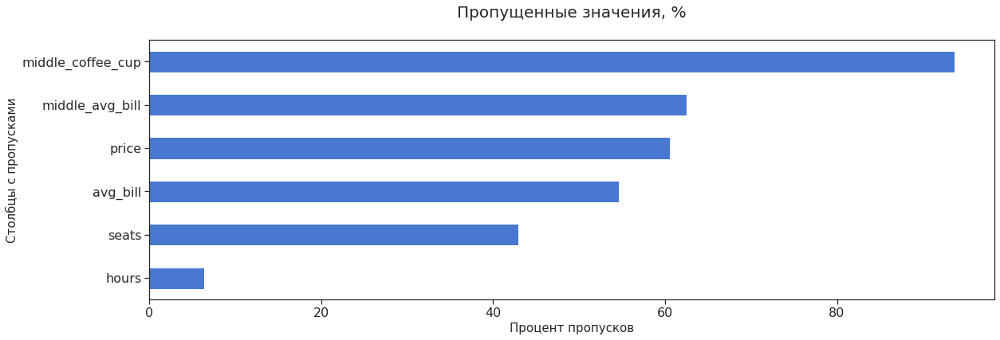

In [199]:
def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = 0, legend = False, fontsize = 16)
        );
        
        plt.ylabel("Столбцы с пропусками", fontsize=15)
        plt.xlabel("Процент пропусков", fontsize=15)
        plt.title('Пропущенные значения, %' + "\n", fontsize=20)
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')
        
pass_value_barh(data)

Видим, что данные с пропусками. Больше всего у нас пропусков в средней стоимости чашки кофе. Затем идут счет, категория цены, средний чек, количество мест, часы работы. 

Данные не полные. Пропуски не будем заполнять, так как это может исказить картину. Большинство заведений не ориентируются на среднюю чашку кофе, например, это больше свойственно для кофейнь. 

In [200]:
data.duplicated().sum()

0

In [201]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [202]:
data['name'] = data['name'].str.replace(' +', ' ', regex=True)
data['address'] = data['address'].str.replace(' +', ' ', regex=True)

In [203]:
data.duplicated(subset=['name','address']).sum()

4

In [204]:
data[data[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Найдено небольшое количество дубликатов по столбцам название - адрес. Избавимся от них, так как это может исказить результаты количества заведений. 

In [205]:
data.drop_duplicates(subset=['name','address'], keep='first', inplace=True)

In [206]:
data.duplicated(subset=['name','address']).sum()

0

Для удобства добавим столбцы с улицей и с круглосуточными заведениями. 

In [207]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [208]:
unique_hours = data['hours'].unique()
for hour in unique_hours[:10]:
    print(hour)

ежедневно, 10:00–22:00
пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00
ежедневно, 09:00–22:00
ежедневно, 10:00–23:00
пн 15:00–04:00; вт-вс 15:00–05:00
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00
ежедневно, 12:00–00:00
ежедневно, круглосуточно
ежедневно, 10:00–21:00
вт-сб 09:00–18:00


In [209]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'

In [210]:
data['is_24_7'].unique()

array([False,  True])

In [211]:
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])

In [212]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,правобережная улица


In [213]:
data['street'].head()

0              улица дыбенко
1              улица дыбенко
2         клязьминская улица
3    улица маршала федоренко
4        правобережная улица
Name: street, dtype: object

В данных были замечены пропуски, но были оставлены, так как если их удалить, то потеряются другие важные данные, заполнять пропуски средними значениями тоже нет смысла. Так как это может исказить имеющееся у нас данные. 

Были удалены дубликаты, созданы столбцы с улицей заведения и с заведениями, которые работают круглосуточно. 

# Анализ данных<a id="j"></a> 

## Категории заведений<a id="h"></a> 

In [214]:
category = data.groupby('category')['name'].count().sort_values(ascending=False)
category.columns = ['category', 'count']

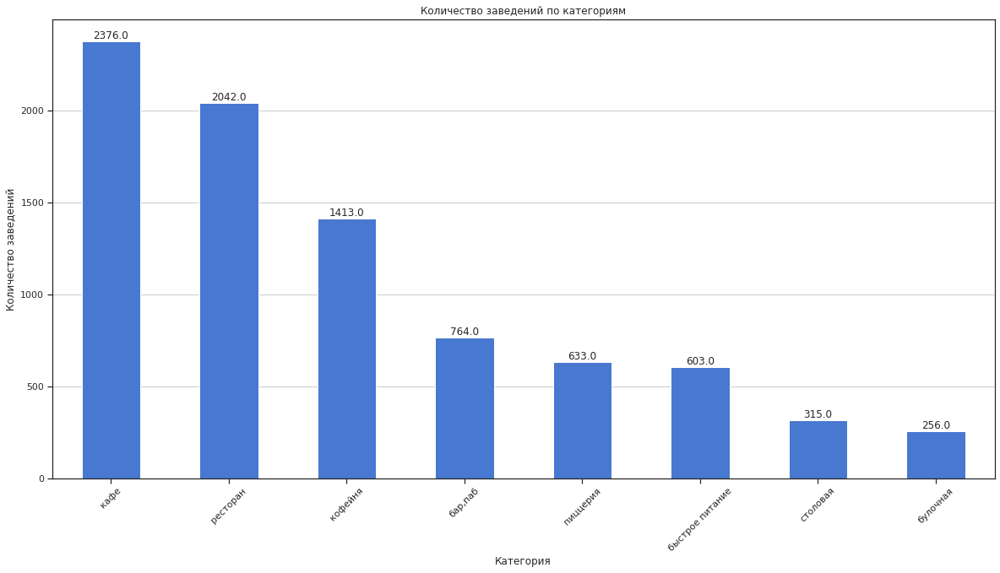

In [215]:
ax = category.plot(x='category', kind='bar', stacked=True, figsize=(20, 10))

plt.grid(axis='y')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.title('Количество заведений по категориям');
plt.xticks(rotation=45)

for i in ax.patches:
    ax.text(i.get_x() + i.get_width()/2, i.get_height(), str(i.get_height()), ha='center', va='bottom')

plt.show()

Больше всего в Москве кафе, ресторанов, кофейнь. Меньше всего столовых и булочных. Пабы, пиццерии, быстрое питание находятся в середине. 

## Посадочные места<a id="g"></a> 

In [216]:
seats = data[data['seats']!=0]

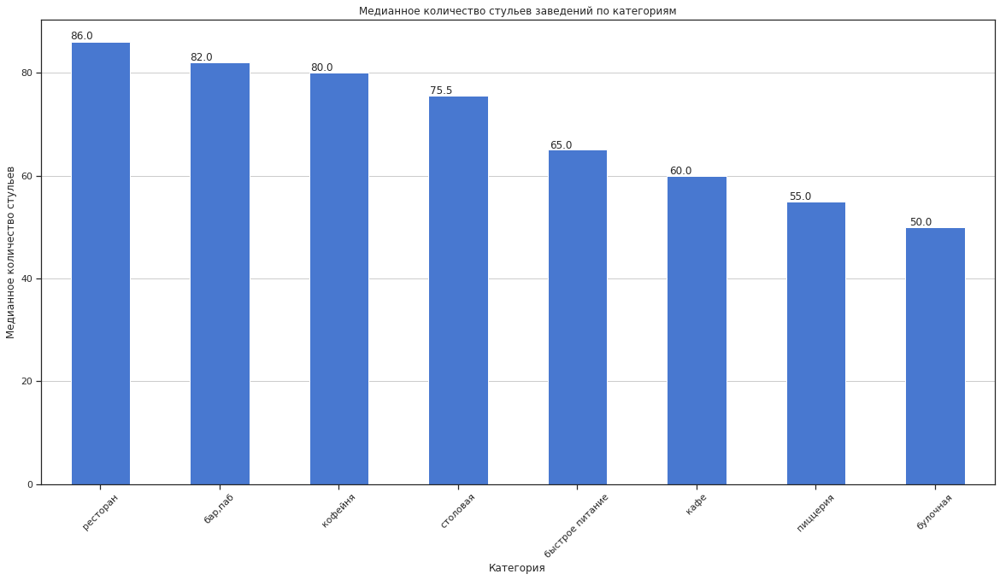

In [217]:
ax = data.groupby('category')['seats'].median().sort_values(ascending=False).plot(kind='bar', 
stacked=True, figsize=(20, 10))
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.xlabel('Категория')
plt.ylabel('Медианное количество стульев')
plt.title('Медианное количество стульев заведений по категориям')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

plt.show()


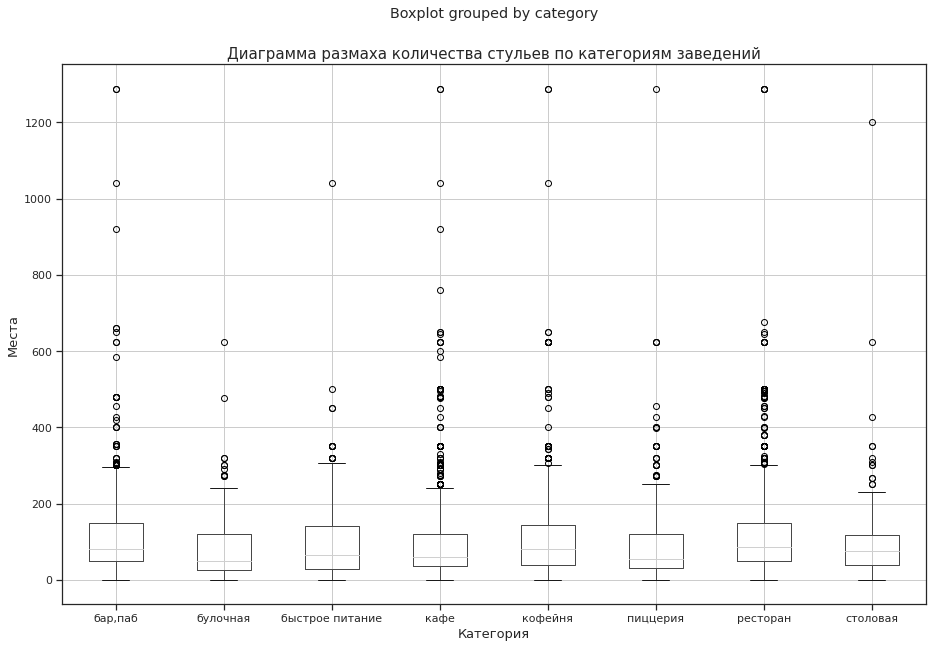

In [218]:
fig, ax = plt.subplots(figsize=(15, 10));
data.boxplot(column='seats', by='category', ax=ax);
ax.set_title('Диаграмма размаха количества стульев по категориям заведений', fontsize=15);
plt.xlabel('Категория', fontsize=13);
plt.ylabel('Места', fontsize=13);

В топ по местам вошли пабы, рестораны, и кофейни. У них средняя больше 114. Затем идут столовые, бытрое питание, кафе. Меньше 100 мест в среднем имеют пиццерии и булочные. 

## Стетевые и не сетевые заведения<a id="f"></a> 

In [219]:
chain = data.groupby(['category', 'chain'])['name'].count().unstack().reset_index().sort_values(ascending=False, by=0)
chain

chain,category,0,1
3,кафе,1597,779
6,ресторан,1313,729
4,кофейня,693,720
0,"бар,паб",596,168
2,быстрое питание,371,232
5,пиццерия,303,330
7,столовая,227,88
1,булочная,99,157


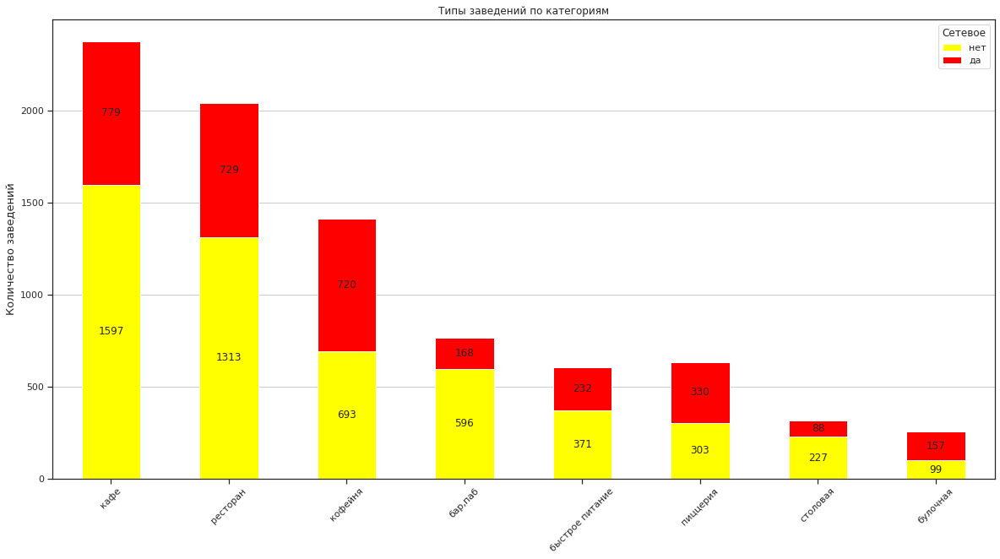

In [220]:
ax = chain.plot(x='category', kind='bar', stacked=True, color=['yellow', 'red'], figsize=(20, 10), title='Типы заведений по категориям')
plt.xlabel("")
plt.ylabel("Количество заведений", fontsize=13)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.legend(["нет", "да"], title="Сетевое")
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.0f}'.format(height), 
            horizontalalignment='center', 
            verticalalignment='center')
    

plt.show()


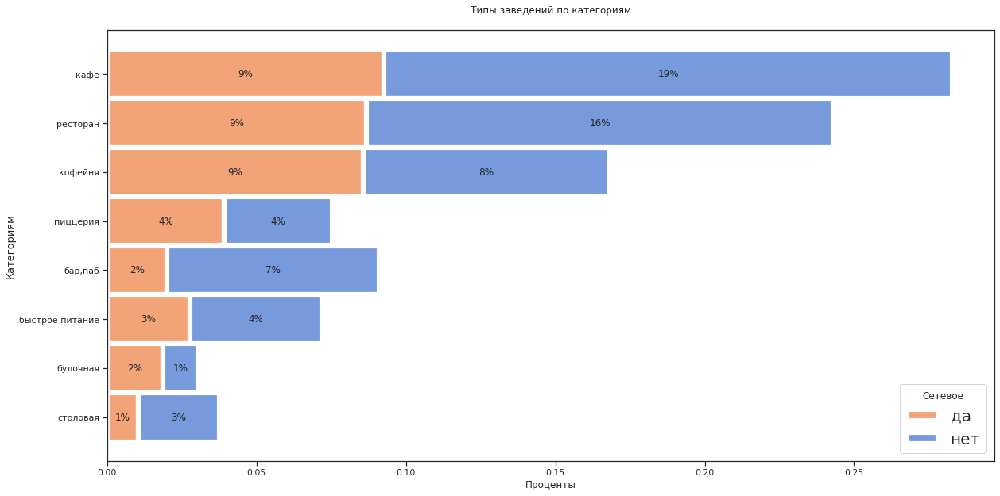

In [221]:
plt.figure(figsize=(20,10))
ax = sns.histplot(data, y='category', hue="chain", element="bars", stat="density", common_norm=True, multiple='stack')
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.text(x+width/2,
            y+height/2,
            '{:.0%}'.format(width),
            horizontalalignment='center',
            verticalalignment='center')
plt.title('Типы заведений по категориям'+"\n")  # Добавляем название графика
plt.xlabel("Проценты")  # Подписываем ось x
plt.ylabel('Категориям', fontsize=13)  # Подписываем ось y
plt.legend(["да", "нет"], title="Сетевое", prop={'size': 20})
plt.show()

In [222]:
chain['reason'] = round(chain[1] / (chain[0] + chain[1])*100)

chain = chain.sort_values(ascending=False, by='reason')

In [223]:
fig = px.bar(chain, x='category', y='reason', title='% сетевых заведений от числа заведений в категории')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(title_text='Процент')
fig.show() 

В кафе, ресторанах, в быстром питании примерно сетевые заведения составляют примерно 1/2 от несетевых. Кофейни, пицерии чуть больше сетевых. Булочных больше сетевых в 1.5 раза. Столовых и пабов занчительно больше несетевых заведений.

## Топ-15 популярных сетей в Москве<a id="d"></a>

In [224]:
data_chain = data[data['chain']==1]
top_15_names = list(data_chain.groupby(['name'])['lng'].count().sort_values(ascending=False).index[:15])
data_chain = data_chain[data_chain['name'].isin(top_15_names)]

data_chain.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,False,базовская улица
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,False,лобненская улица
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,False,коровинское шоссе
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,False,клязьминская улица
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,False,улица маршала федоренко


In [225]:
top_15 = data_chain.groupby(['name']).agg({'lng':'count'}).reset_index().sort_values(ascending=False, by=['lng'])
top_15 = top_15.rename(columns = {'lng': 'count'})
top_15

,name,count
13,шоколадница,120
6,домино'с пицца,76
5,додо пицца,74
2,one price coffee,71
14,яндекс лавка,69
1,cofix,65
3,prime,50
11,хинкальная,44
7,кофепорт,42
8,кулинарная лавка братьев караваевых,39


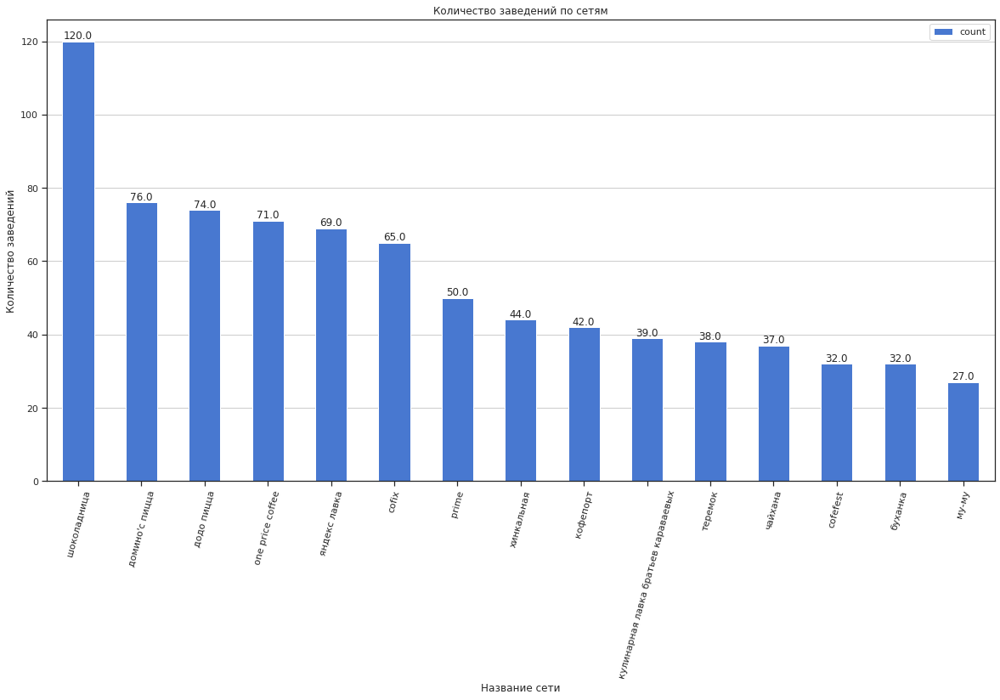

In [226]:
ax = top_15.plot(x='name', y='count', kind='bar', stacked=True, figsize=(20, 10))

plt.grid(axis='y')
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.title('Количество заведений по сетям');
plt.xticks(rotation=75)

for i in ax.patches:
    ax.text(i.get_x() + i.get_width()/2, i.get_height(), str(i.get_height()), ha='center', va='bottom')

plt.show()

Мы видим, что в топ сетевых заведений вошли сети с большим разрывом по количеству. между первым и 15 местом разница в 4 раза. 

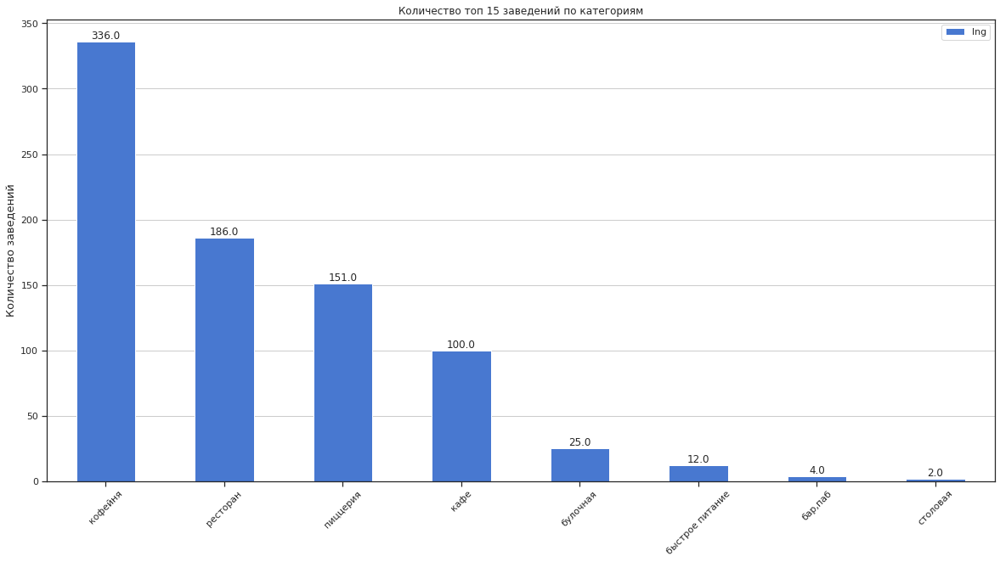

In [227]:

ax = data_chain.groupby('category').agg({'lng':'count'}).reset_index()\
.sort_values(ascending=False, by=['lng'])\
.plot(x='category', y='lng', kind='bar', stacked=True,  figsize=(20, 10), title='Количество топ 15 заведений по категориям')

plt.xlabel("")
plt.ylabel("Количество заведений", fontsize=13)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.legend()
for i in ax.patches:
    ax.text(i.get_x() + i.get_width()/2, i.get_height(), str(i.get_height()), ha='center', va='bottom')

plt.show()

Среди топа 15 сетей на удивление присутствуют все 8 категорий. Большинство сетевых заведений из топа относятся к кофейням. Бары пабы, быстрое питание, булочные, составляют очень незначительную долю от общего значения. 

## Административные районы Москвы<a id="s"></a>

In [228]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [229]:
district = data.groupby('district').agg({'name':'count'}).reset_index()\
.sort_values(ascending=False, by=['name'])
district

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [230]:
district['name'].sum()

8402

In [231]:
fig = go.Figure(data=[go.Pie(labels=district['district'], values=district['name'], hole=0.5)])
fig.update_layout(annotations=[dict(text='Всего заведений<br>8402', x=0.5, y=0.5, font_size=12, showarrow=False)])
fig.update_layout(title='Количество заведений по округам', title_x = 0.22)
fig.show() 

In [232]:
fig = px.histogram(data, x="district", y="name", color="category", histfunc='count')
fig.update_layout(title_text='Количество заведений по округам и по категориям')
fig.update_xaxes(title_text='Округа')
fig.update_yaxes(title_text='Количество')
fig.update_layout(width=1200, height=800)
fig.update_layout(plot_bgcolor='white')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.update_layout(legend=dict(title="Категория"))
fig.show()

Лидером по количеству заведений является ЦАО, остальные округа составляют по 11-8 процентов. Аутсайдером является СЗАО, там всего около 5 процентов от общего количества. 

## Рейтинги<a id="a"></a>

Рассмотрим рейтинги по категориям есть ли различия. 

In [233]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [234]:
rating_cafe = data[data['category'] == 'кафе']
rating_rest = data[data['category'] == 'ресторан']
rating_coff = data[data['category'] == 'кофейня']
rating_pizza = data[data['category'] == 'пиццерия']
rating_pab = data[data['category'] == 'бар,паб']
rating_fast = data[data['category'] == 'быстрое питание']
rating_cake = data[data['category'] == 'булочная']
rating_dinn = data[data['category'] == 'столовая']

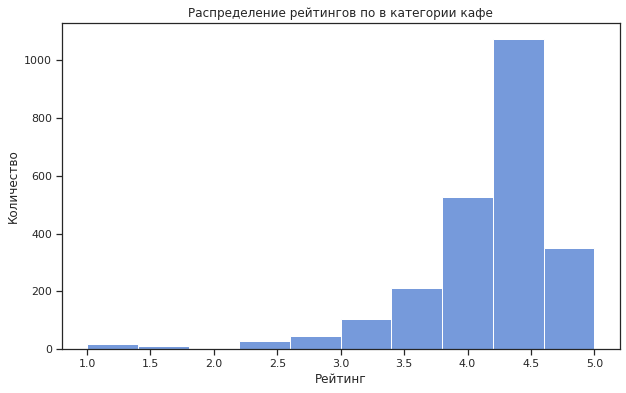

In [235]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_cafe['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории кафе')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

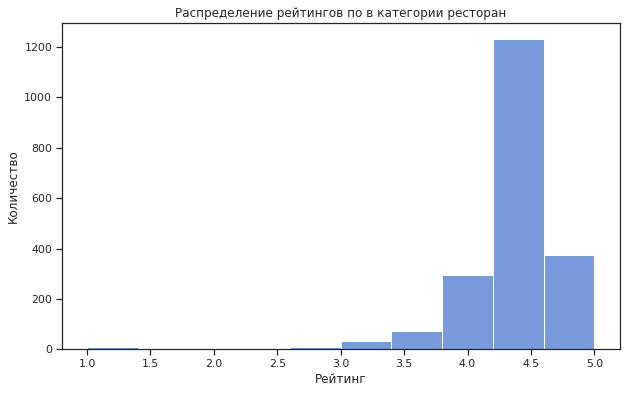

In [236]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_rest['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории ресторан')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

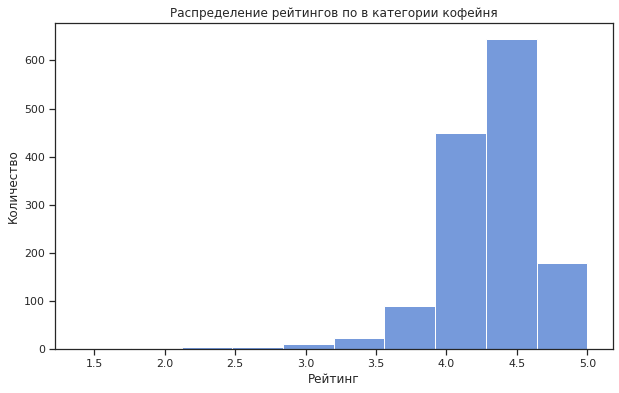

In [237]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_coff['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории кофейня')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

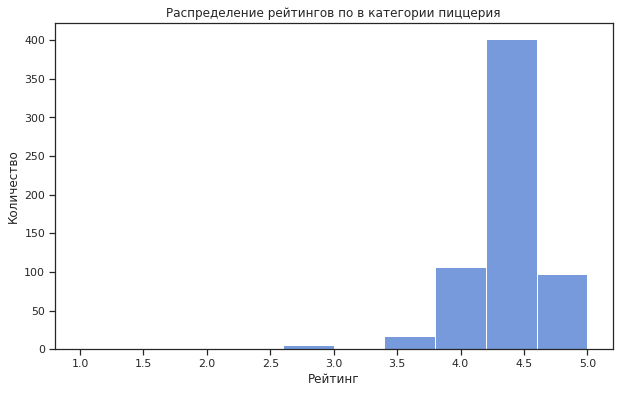

In [238]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_pizza['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории пиццерия')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

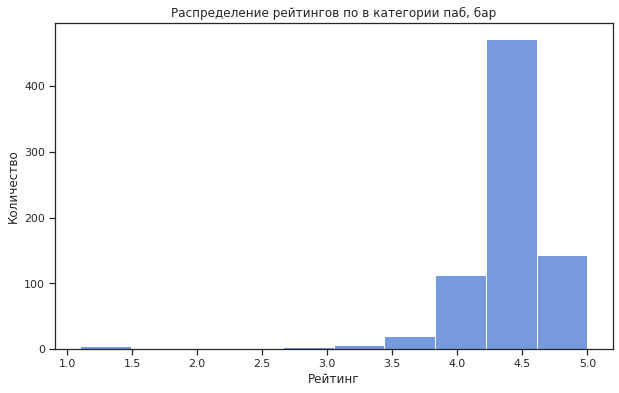

In [239]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_pab['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории паб, бар')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

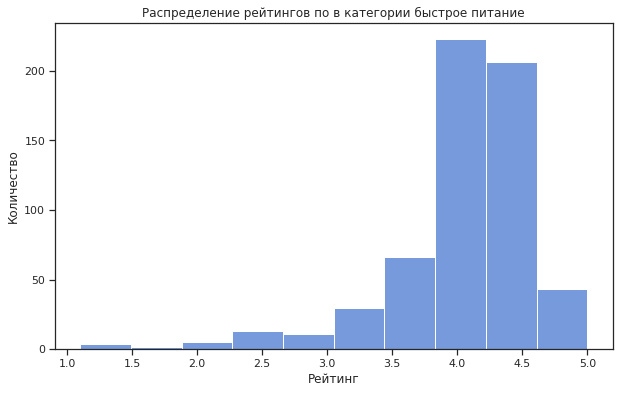

In [240]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_fast['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории быстрое питание')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

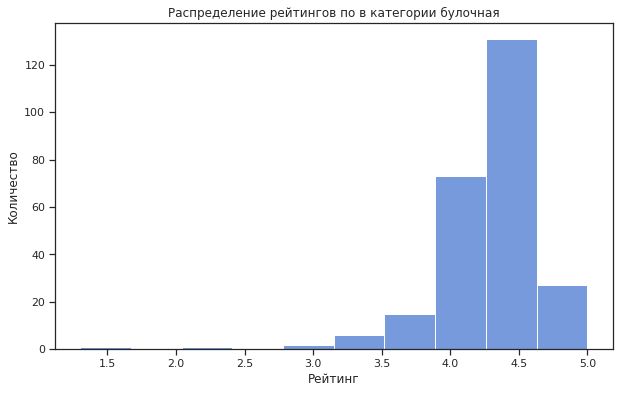

In [241]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_cake['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории булочная')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

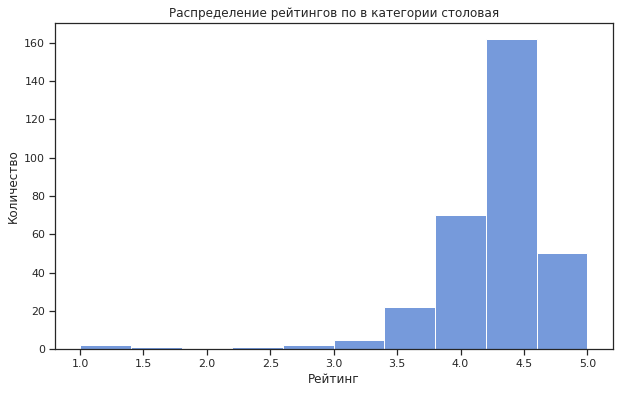

In [242]:
plt.figure(figsize=(10, 6))
sns.histplot(rating_dinn['rating'], bins=10, ) 
plt.title('Распределение рейтингов по в категории столовая')  
plt.xlabel('Рейтинг') 
plt.ylabel('Количество')  
plt.show()

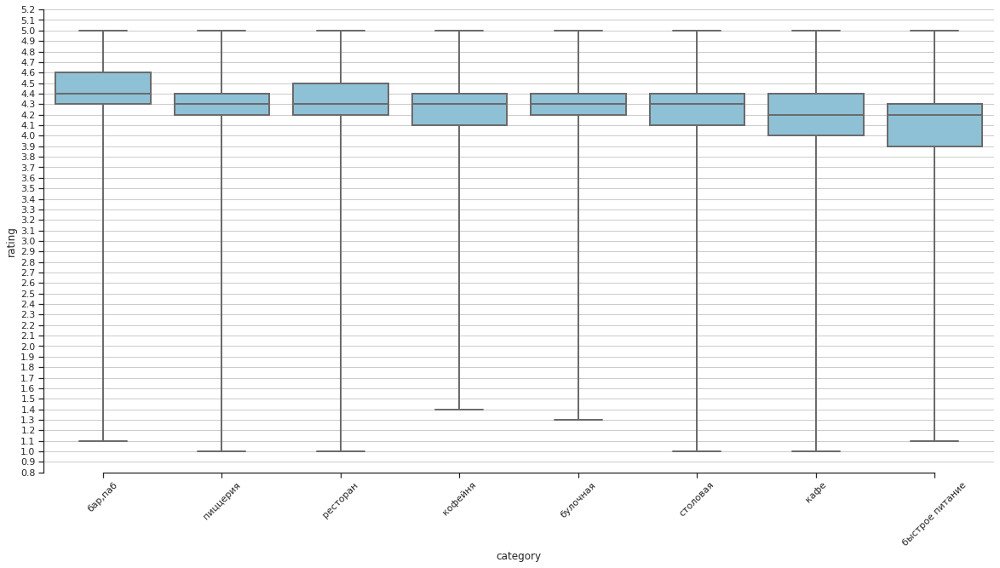

In [243]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.yticks(np.arange(0, 10, 0.1))

sns.set(style="ticks", palette="muted", color_codes=True)

# Load the example planets dataset
planets = sns.load_dataset("planets")

ranks = data.groupby("category")["rating"].mean().fillna(0).sort_values()[::-1].index

# Plot the orbital period with horizontal boxes
ax = sns.boxplot(x='category', y='rating', data=data,
                 whis=np.inf, color="c", linewidth = 2,  order = ranks)

sns.despine(trim=True)

In [244]:
rating_c_r = data.groupby('category').agg('rating').mean().reset_index()\
.sort_values(ascending=False, by=['rating'])
rating_c_r

,category,rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


теперь рассмотрим рейтинки в зависимости от регионов. 

In [245]:
rating_district = data.groupby('district').agg('rating').mean().reset_index()\
.sort_values(ascending=False, by=['rating'])
rating_district

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240980
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


Мы видим, что по регионам по средней оценки нет практически разницы. Среднии рейтинги по регионам находятся в диапозоне 4.4 - 4.1.

В распределении средних оценок заведений отличаются категорий Быстрое питание и кофейня. То есть большее количество оценок сосредоточено у остальных категорий на 4.5, а у категорий Быстрое питание и кофейня больше оценок 4, чем у остальных. У категории Быстрое питание оценка 4 превышает оценки 4.5, а у кофейн оценка 4 высока, но оценок 4.5, все таки больше. 

Отобразим рейтинги на карте для наглядности. 

In [246]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


In [247]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Мы видим, что проваливается ЮВАО, цао - самый высокий рейтинг. 

<div class="alert alert-block alert-success">
<b>Комментарий ревьюера:</b> Карта отлично показывает разницу по районам.
    
</div>

In [248]:
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём пустой кластер, добавляем его на карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# пишем функцию, которая принимает строку датафрейма,
marker_cluster = MarkerCluster().add_to(m)
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

## Топ 15 улиц<a id="p"></a>

In [249]:
street_top = data.groupby('street').agg({'name': 'count', 'district': 'first'}).reset_index()\
.sort_values(ascending=False, by=['name']).head(15)
street_top

,street,name,district
837,проспект мира,183,Северо-Восточный административный округ
841,профсоюзная улица,122,Юго-Западный административный округ
834,проспект вернадского,108,Западный административный округ
533,ленинский проспект,107,Центральный административный округ
531,ленинградский проспект,95,Северный административный округ
379,дмитровское шоссе,88,Северный административный округ
461,каширское шоссе,77,Южный административный округ
304,варшавское шоссе,76,Южный административный округ
532,ленинградское шоссе,70,Северный административный округ
610,мкад,65,Северный административный округ


Мы видим, по графику, что количество заведений на улице зависит от ее протяженности. Это проспекты, шоссе, мкад и длинные улицы. Например, мкад опоясывает Москву, проходя чаще всего отдельно от жилых строений и бизнес центров. Однако мкад вошел в топ на 10 месте. В топ вошла из центрального округа только Пятницкая улица из ЦАО самой последней.  


*В данном случае на округ некорретно ориентироваться, так как большие улицы и проспекты могут проходить через несколько округов, например мкад. Это сделано больше для того, чтобы увидеть не настолько небольшие улицы в ЦАО.

In [250]:
top_15_names_2 = street_top['street']
street_top_data = data[data['street'].isin(top_15_names_2)]
street_top_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,False,дмитровское шоссе
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,False,мкад
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,True,ленинградское шоссе
26,пикочино,пиццерия,"москва, дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,False,дмитровское шоссе
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,False,мкад


In [251]:
street_top_data_2 = street_top_data.groupby(['street', 'category'])\
.agg({'name': 'count'}).unstack().reset_index()
street_top_data_2['sum'] = street_top_data_2.sum(axis=1)
street_top_data_2 = street_top_data_2.sort_values(by='sum', ascending=False)
street_top_data_2.drop(['sum'], axis= 1 , inplace= True )
street_top_data_2

/opt/conda/lib/python3.9/site-packages/pandas/core/generic.py:4153: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



street    name                                 \
category                         бар,паб булочная быстрое питание  кафе   
10                 проспект мира    11.0      4.0            21.0  53.0   
11             профсоюзная улица     6.0      4.0            15.0  35.0   
9           проспект вернадского     7.0      1.0            12.0  25.0   
6             ленинский проспект    10.0      3.0             2.0  26.0   
4         ленинградский проспект    15.0      4.0             2.0  12.0   
1              дмитровское шоссе     6.0      2.0            10.0  23.0   
2                каширское шоссе     2.0      NaN            10.0  20.0   
0               варшавское шоссе     6.0      NaN             7.0  18.0   
5            ленинградское шоссе     5.0      2.0             5.0  13.0   
8                           мкад     1.0      NaN             9.0  45.0   
7               люблинская улица     5.0      NaN             5.0  26.0   
13                улица вавилова     2.0      2.0            11.0  15.0   
3           кутузовский проспект     2.0      1.0             2.0  14.0   
14          улица миклухо-маклая     3.0      NaN             4.0  21.0   
12               пятницкая улица     9.0      3.0             2.0   7.0   

                                             
category кофейня пиццерия ресторан столовая  
10          36.0     11.0     45.0      2.0  
11          18.0     15.0     26.0      3.0  
9           16.0     12.0     33.0      2.0  
6           23.0      5.0     33.0      5.0  
4           25.0      9.0     25.0      3.0  
1           11.0      8.0     24.0      4.0  
2           16.0      5.0     19.0      5.0  
0           14.0      4.0     20.0      7.0  
5           13.0      3.0     26.0      3.0  
8            4.0      NaN      5.0      1.0  
7           11.0      1.0     10.0      2.0  
13          10.0      3.0     12.0      NaN  
3           13.0      3.0     16.0      3.0  
14           4.0      2.0     15.0      NaN  
12           6.0      3.0     18.0      NaN

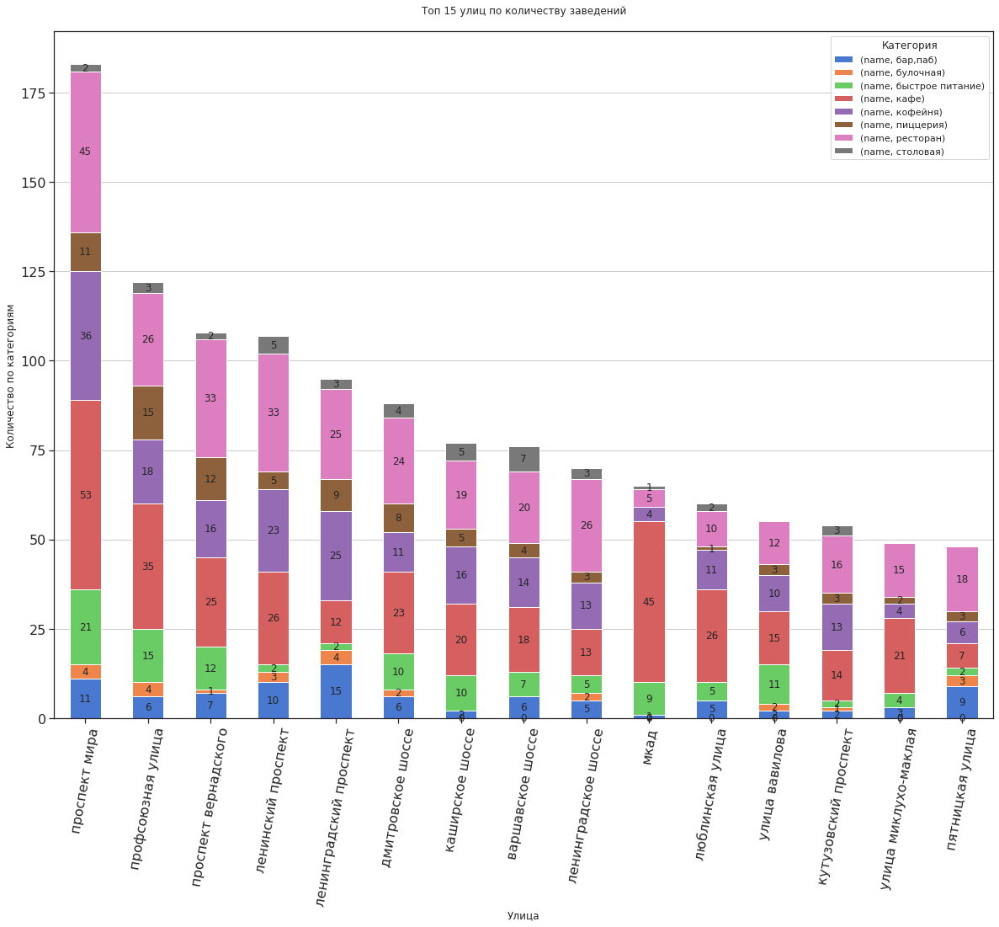

In [252]:

ax = street_top_data_2.plot(x='street', kind='bar', stacked=True,\
title='Топ 15 улиц по количеству заведений'+"\n", figsize=(20, 15), rot = 0, fontsize = 16)

plt.xlabel('Улица') 
plt.ylabel('Количество по категориям')
plt.xticks(rotation=80)
plt.grid(axis='y')
plt.legend(title='Категория')
#plt.update_layout(yaxis = {"categoryorder":"total ascending"})
#plt.gca().invert_yaxis()
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.0f}'.format(height), 
            horizontalalignment='center', 
            verticalalignment='center')
plt.show()

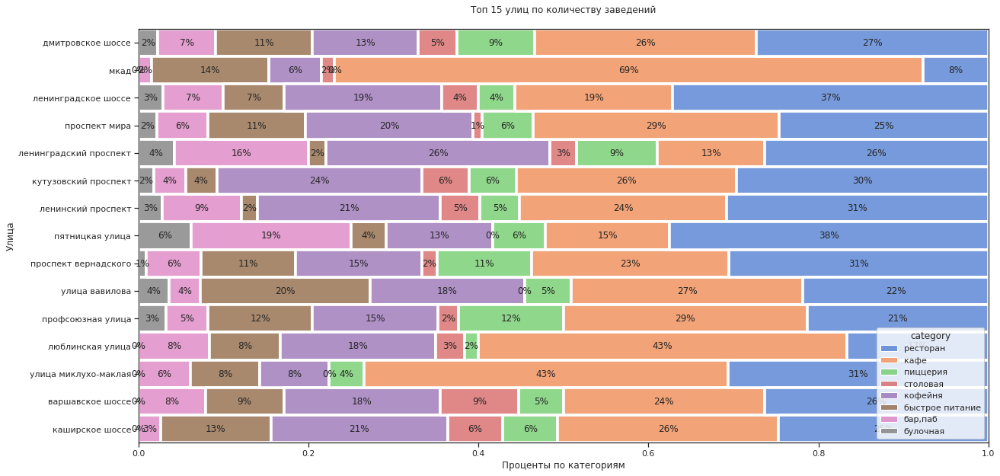

In [253]:
plt.figure(figsize=(20,10))
ax = sns.histplot(street_top_data, y='street', hue="category", element="bars", stat="density", common_norm=True, multiple="fill")
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.text(x+width/2,
            y+height/2,
            '{:.0%}'.format(width),
            horizontalalignment='center',
            verticalalignment='center')
plt.title('Топ 15 улиц по количеству заведений'+"\n")  # Добавляем название графика
plt.xlabel('Проценты по категориям')  # Подписываем ось x
plt.ylabel('Улица')  # Подписываем ось y
plt.show()

В топ 15 улиц, большее количество заведений кафе, ресторанам, кофейням. Остальные заведения встречаются сильно реже. 

## Улицы только с одним заведением<a id="o"></a>

Есть ли улицы, которые находятся на выгодной улице, где отсутствует конкуренция? Например, рассмотрим улицы, где встречется только одно заведение. 

In [254]:
street_ = data.groupby('street').agg({'name': 'count'}).reset_index()
street_ = street_.query('name ==1')
street_lose = data[data['street'].isin(street_['street'])]
street_lose.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,False,улица бусиновская горка
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,False,прибрежный проезд
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,False,парк левобережный
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,False,угличская улица
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,False,ландшафтный заказник лианозовский


In [255]:
print(street_lose['category'].unique())
print(street_lose['district'].unique())


['столовая' 'кафе' 'кофейня' 'ресторан' 'бар,паб' 'быстрое питание'
 'пиццерия' 'булочная']
['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Центральный административный округ' 'Восточный административный округ'
 'Западный административный округ' 'Юго-Восточный административный округ'
 'Юго-Западный административный округ' 'Южный административный округ']


In [256]:
street_lose.groupby('category').agg({'street': 'count'}).sort_values(ascending=False, by='street')

,street
category,
кафе,159
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [257]:
street_lose.groupby('district').agg({'street': 'count'}).sort_values(ascending=False, by='street')

,street
district,
Центральный административный округ,145
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,51
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


In [258]:
fig = px.histogram(street_lose, x="district", y="name", color="category", histfunc='count')
fig.update_layout(title_text='Количество заведений на одной улице по округам и по категориям')
fig.update_xaxes(title_text='Округа')
fig.update_yaxes(title_text='Количество')
fig.update_layout(width=1200, height=800)
fig.update_layout(plot_bgcolor='white')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

In [259]:
street_lose.groupby('chain').agg({'street': 'count'}).sort_values(ascending=False, by='street')

,street
chain,
0,324
1,133


In [260]:
fig = px.histogram(street_lose, x="district", y="name", color="chain", histfunc='count')
fig.update_layout(title_text='Количество заведений на одной улице по округам и по типам')
fig.update_xaxes(title_text='Округа')
fig.update_yaxes(title_text='Количество')
fig.update_layout(width=1200, height=800)
fig.update_layout(plot_bgcolor='white')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Мы видем, что улиц, где встречается только 1 заведение довольно много. Встречаются сетевые и не сетевые, всех категорий и всех округов. По количеству в цао их больше всего. Это говорит о том, что чаще это небольшие улицы, которые располагаются недалеко от больших улиц, где встречаются большое количество заведений. 

## Разница цен по округам<a id="m"></a>

In [261]:
middle_avg_bill = data.groupby('district').agg({'middle_avg_bill': 'median'}).reset_index()\
.sort_values(ascending=False, by='middle_avg_bill')
middle_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [262]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианна среднего чека заведений по районам',
).add_to(m)

# выводим карту
m

Самые дорогие чеки в ЦАО и ЗАО. Самые маленькие чеки ЮВАО, ЮАО, СВАО. В середине - ВАО, ЮЗАО, САО, СЗАО. Разница достигает 50 процентов. 

# Кофейни<a id="i"></a>

## Количество кофейнь по округам<a id="u"></a>

In [263]:
rating_coff.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица маршала федоренко
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,False,парк левобережный
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,False,коровинское шоссе
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,False,улица маршала федоренко
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,False,улица дыбенко


In [264]:
rating_coff['name'].count()

1413

In [265]:
co_district = rating_coff.groupby('district').agg({'name': 'count'}).reset_index()\
.sort_values(ascending=False, by='name')
co_district

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [266]:
fig = go.Figure(data=[go.Pie(labels=co_district['district'], values=co_district['name'], hole=0.5)])
fig.update_layout(annotations=[dict(text='Всего кофейнь<br>1413', x=0.5, y=0.5, font_size=12, showarrow=False)])
fig.update_layout(title='Количество кофейнь округам', title_x = 0.17)
fig.show() 

In [267]:
fig = px.bar(co_district, x='district', y='name', title='Количество кофеен по округам')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Округ')
fig.update_yaxes(title_text='Количество')
fig.show() 

Чуть меньше трети всех кофеен находятся в ЦАО. по 14-10 процентов в САО, СВАО, ЗАО, ЮАО (середняки). Регионы с малым количиством кофеен - ВАО, ЮЗАО, ЮВАО, СЗАО. 

## Топ 15 улиц по количеству кофейнь<a id="y"></a>

In [268]:
co_street = rating_coff.groupby('street').agg({'name': 'count', 'district': 'first'}).reset_index()\
.sort_values(ascending=False, by='name')
co_street.head(15)

,street,name,district
360,проспект мира,36,Северо-Восточный административный округ
216,ленинградский проспект,25,Северный административный округ
218,ленинский проспект,23,Центральный административный округ
362,профсоюзная улица,18,Юго-Западный административный округ
358,проспект вернадского,16,Западный административный округ
181,каширское шоссе,16,Южный административный округ
123,варшавское шоссе,14,Южный административный округ
217,ленинградское шоссе,13,Северный административный округ
290,новослободская улица,13,Центральный административный округ
210,кутузовский проспект,13,Западный административный округ


In [269]:
street_top

,street,name,district
837,проспект мира,183,Северо-Восточный административный округ
841,профсоюзная улица,122,Юго-Западный административный округ
834,проспект вернадского,108,Западный административный округ
533,ленинский проспект,107,Центральный административный округ
531,ленинградский проспект,95,Северный административный округ
379,дмитровское шоссе,88,Северный административный округ
461,каширское шоссе,77,Южный административный округ
304,варшавское шоссе,76,Южный административный округ
532,ленинградское шоссе,70,Северный административный округ
610,мкад,65,Северный административный округ


In [270]:


fig = px.bar(co_street.head(15), x='street', y='name', title='Топ 15 улиц по количеству кофейнь')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Улица')
fig.update_yaxes(title_text='Количество')
fig.show() 

Топ-15 улиц с количеством кофейнь совпадает с топ 15 улиц с общим количеством заведений. На мкаде кофейнь мало, все таки это магистрать круговая, поэтому в списке топ улиц появился волгоградский проспект, который тоже является продолжительным по своему километражу.Появилась новослободская ул, которая находтится в ЦАО. 

Новодмитровская улица тоже входит в топ 15 улиц по кофейням. Эта улица является исключением из тех параметров, которые мы выявили. 



## Круглосуточные кофейни<a id="t"></a>

Рассмотрим, кофейни, которые работают круглосуточно

In [271]:
с_24_7 = rating_coff[rating_coff['hours'] == 'ежедневно, круглосуточно']

с_24_7['name'].count()

59

In [272]:
с_24_7.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,True,дмитровское шоссе
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,True,ярославское шоссе
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,True,ярославское шоссе
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,True,мкад
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,True,улица народного ополчения


In [273]:
с_24_7 = с_24_7.groupby('district').agg({'name': 'count'}).reset_index()\
.sort_values(ascending=False, by='name')
с_24_7

,district,name
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [274]:
fig = go.Figure(data=[go.Pie(labels=с_24_7['district'], values=с_24_7['name'], hole=0.5)])
fig.update_layout(annotations=[dict(text='Всего<br>59', x=0.5, y=0.5, font_size=12, showarrow=False)])
fig.update_layout(title='Количество круглосуточных кофейнь округам', title_x = 0.17)
fig.show() 

In [275]:
fig = px.bar(с_24_7, x='district', y='name', title='Количество круглосуточных кофейнь округам')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Округ')
fig.update_yaxes(title_text='Количество')
fig.show() 

Лидером по количеству круглосуточных кофейнь является ЦАО. Небольшое количество круглосуточных кофейнь присутствует в ЗАО, ЮЗАО, ВАО, САО. В остальных регионах круглосуточных кофейнь очень мало. 

## Рейтинг кофейнь<a id="r"></a>

In [276]:
r_district = rating_coff.groupby('district').agg({'rating': 'mean'}).reset_index()\
.sort_values(ascending=False, by='rating')
r_district

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


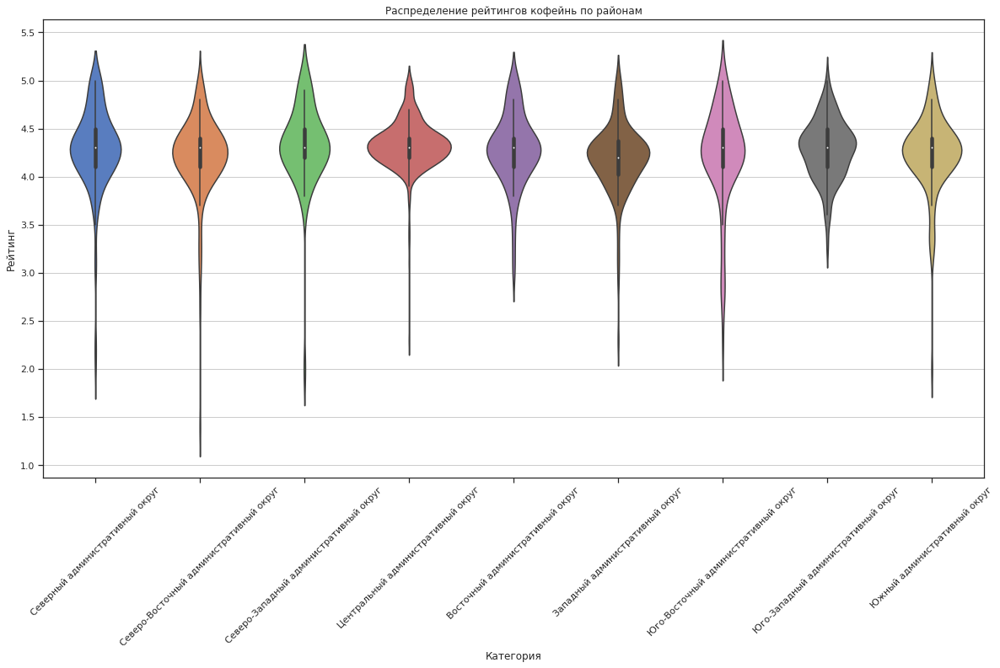

In [277]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.yticks(np.arange(0, 10, 0.5))
sns.violinplot(x='district', y='rating', data=rating_coff)
plt.title('Распределение рейтингов кофейнь по районам')  # Добавляем название графика
plt.xlabel('Категория')  # Подписываем ось x
plt.ylabel('Рейтинг')  # Подписываем ось y
plt.show()

In [278]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=r_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг кофейнь по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
rating_coff.apply(create_clusters, axis=1)
# выводим карту
m

Среди регионов по рейтингу кофейн тоже присутствует небольшая разница. Лидерами являются ЦАО, СЗАО. Самые небольшие рейтинги у ЗАО и СВАО.

## Средняя стоимость заказа в кофейнях<a id="e"></a>

In [279]:
coff_price = rating_coff.groupby('district').agg({'middle_avg_bill': 'median'}).reset_index()\
.sort_values(ascending=False, by='middle_avg_bill')
coff_price

,district,middle_avg_bill
1,Западный административный округ,600.0
5,Центральный административный округ,500.0
0,Восточный административный округ,400.0
8,Южный административный округ,387.5
7,Юго-Западный административный округ,375.0
2,Северный административный округ,325.0
3,Северо-Восточный административный округ,325.0
4,Северо-Западный административный округ,325.0
6,Юго-Восточный административный округ,250.0


In [280]:
round(coff_price['middle_avg_bill'].mean())

388

In [281]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


Choropleth(
    geo_data=state_geo,
    data=coff_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианна среднего чека заведений по районам',
).add_to(m)

# выводим карту
m

Обратим внимание на ЗАО, там средний чек выше даже чем в ЦАО. По количеству кофеен, он находится на втором месте, но сильно уступает ЦАО. Также стоит заметить, что в этом округе, один из самых нихких рейтингов кофейн. То есть, следует предположить, что кофейни пользуются большим спросом в этом регионе чем в других, за исключением ЦАО.Недовольство клиентов, зависит ли от стоимости или нет?

## Стоимость чашки кофе<a id="w"></a>

In [282]:
coff_cup = rating_coff.groupby('district').agg({'middle_coffee_cup': 'median'}).reset_index()\
.sort_values(ascending=False, by='middle_coffee_cup')
coff_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [283]:
round(coff_cup['middle_coffee_cup'].mean())

166

In [284]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


Choropleth(
    geo_data=state_geo,
    data=coff_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианна средней стоимости чашки кофе по районам',
).add_to(m)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
rating_coff.apply(create_clusters, axis=1)
# выводим карту
m

По средней стоимости чашки кофе, топ вышли ЮЗАО, ЦАО И ЗАО. В ЗАО действительно самая дорогая стоимость чашки кофе. Это может быть причиной низких оценок. 

Средняя стоимоть кофе по Москве в кофейнях составляет 166 рублей. Изначально, стоит рассматривать эту стоимость чашки кофе. Если определиться с регионом, то можно ориентироваться на сребнюю по региону, опять же, нужно учитывать удаленность от центра. Если открыть кафейню в спальном районе с дорогим кофе, то врядли жители будут массово посещать кофейню. 

# Выводы<a id="q"></a>

Общий рынок общепита Москвы

Была проведена работа с данными. Данные были проверены на ошибки. Дубликаты были удалены. Пропуски в данных были оставлены, так как если их убрать, потеряются большинство важных данных, а заполнение средним значением может исказить результаты при делении на группы. Были добавлены новые столбцы с круглосуточными заведениями и с названием улицы. 

По данным, в Москве отражается следующая картина. Больше всего в Москве кафе, ресторанов, кофейнь. Меньше всего столовых и булочных. Пабы, пиццерии, быстрое питание находятся в середине. 

По количеству мест, получились неожиданные результаты. В топ по местам вошли пабы, рестораны, и кофейни. У них средняя больше 114. Затем идут столовые, бытрое питание, кафе. Меньше 100 мест в среднем имеют пиццерии и булочные. 

В кафе, ресторанах, в быстром питании, округляя, сетевые заведения составляют примерно 1/2 от несетевых. Кофейн, пицерий чуть больше сетевых. Булочных больше сетевых в 1.5 раза. Столовых и пабов занчительно больше несетевых заведений.

Лидером по количеству заведений является ЦАО, остальные округа составляют по 11-8 процентов. Аутсайдером является СЗАО, там всего около 5 процентов от общего количества. 

В распределении средних оценок заведений отличаются категорий Быстрое питание и кофейня. То есть большее количество оценок сосредоточено у остальных категорий на 4.5, а у категорий Быстрое питание и кофейня больше оценок 4, чем у остальных. У категории Быстрое питание оценка 4 превышает оценки 4.5, а у кофейн оценка 4 высока, но оценок 4.5, все таки больше. По округам мы видим, что самы низкий ценн ЮВАО, ЦАО - самый высокий рейтинг.

В топ 15 улиц, большее количество заведений кафе, ресторанам, кофейням. Остальные заведения встречаются сильно реже, но они тоже присутствуют практически на каждой крупной улице.

Мы видем, что улиц, где встречается только 1 заведение довольно много. Встречаются сетевые и не сетевые, всех категорий и всех округов. По количеству в цао их больше всего. Это говорит о том, что чаще это небольшие улицы, которые располагаются недалеко от больших улиц, где встречаются большое количество заведений. 

Самые дорогие чеки в ЦАО и ЗАО. Самые маленькие чеки ЮВАО, ЮАО, СВАО. В середине - ВАО, ЮЗАО, САО, СЗАО. Разница достигает между самым дорогим и самым дешевым регионом больше 50 процентов. 

Рынок кофейнь в Москве

Мы уже выснили, что кофени, входят в топ 3 по количеству заведений и количеству мест. Также по топ 15 улицам кофейни занимают третье место по распространенности. Среди кофень, сетевых, чуть больше, чем несетевых. Оценки у кофейнь средние среди всех категорий. 

Чуть меньше трети всех кофеен находятся в ЦАО. по 14-10 процентов в САО, СВАО, ЗАО, ЮАО (середняки). Регионы с малым количиством кофеен - ВАО, ЮЗАО, ЮВАО, СЗАО. 

Топ-15 улиц с количеством кофейнь совпадает с топ 15 улиц с общим количеством заведений. На мкаде кофейнь мало, все таки это магистрать круговая, поэтому в списке топ улиц появился волгоградский проспект, который тоже является продолжительным по своему километражу.Появилась новослободская ул, которая находтится в ЦАО.

Лидером по количеству круглосуточных кофейнь является ЦАО. Небольшое количество круглосуточных кофейнь присутствует в ЗАО, ЮЗАО, ВАО, САО. В остальных регионах круглосуточных кофейнь очень мало. 

Среди регионов по рейтингу кофейн тоже присутствует небольшая разница. Лидерами являются ЦАО, СЗАО. Самые небольшие рейтинги у ЗАО и СВАО.

В ЗАО средний чек выше даже чем в ЦАО. По количеству кофеен, он находится на втором месте, но сильно уступает ЦАО. Также стоит заметить, что в этом округе, один из самых нихких рейтингов кофейн. То есть, следует предположить, что кофейни пользуются большим спросом в этом регионе чем в других, за исключением ЦАО.

По средней стоимости чашки кофе, топ вышли ЮЗАО, ЦАО И ЗАО. Средняя стоимоть кофе по Москве в кофейнях составляет 166 рублей. Изначально, стоит рассматривать эту стоимость чашки кофе. Если определиться с регионом, то можно ориентироваться на сребнюю по региону, опять же, нужно учитывать удаленность от центра. Если открыть кафейню в спальном районе с дорогим кофе, то врядли жители будут массово посещать кофейню. 

Рекомендации:

Для открытия кофейни следуюет учитывать, что эти заведения являются одними из самых распространенных. 

Среди перспективных регионов для открытия кофейни, можно выделит ЦАО - регион с большой конкуренцией, но с одним из самых высоких чеков. Это исторический и деловой центр, поэтому там спрос всегда будет. 

Также рекомендую обратить внимание на ЗАО. Там мало кофейнь, но судя по среднему чеку, среди населения кофейни популярны. В этом регионе самая высокая стоимость кружки кофе, в то же время по сравнению с другими регионами, самих кофейнь не большое количество. В тоже время этот регион с низкой оценкой кофейнь. То есть, можно предположить, что население не удовлетворено стоимостью либо, по каким то другим параметрам кофейни региона не удовлетворяют население. Это можно использовать как конкурентное преимущество. 

Средняя стоимоть кофе по Москве в кофейнях составляет 166 рублей. В ЦАО и ЗАО - 190 рублей. Рекомендую, именно на среюнюю стоимость по региону рассчитывать. Так как если указать дорогую цену, то она может отпугнуть потенциальных покупателей. Слишком низкая цена может оказаться не прибыльной для кофейни и у по низкой цене предложить клиенту будет можно более простой кофе, что также скажется на посетитилях. Стоимость кружки также складывается из арендной платы, которая разнится по регионам. Также в каждом регионе следует учесть удаленность от центра. 

Презентация: https://disk.yandex.ru/i/LTPPoRe1aTmBqA